## Problem 1. Clustering with the k-Means algorithm

In [1]:
import numpy as np
import random as rd

In [1]:
# Problem 1 (a)
def euclidean_distance(a, b):
    """ 
    Takes two vectors and returns the Euclidean distance between them 
    Input: a - input vector a
           b - input vector b
    Output: the Euclidean distance between vectors a and b
    """
    vector_sum = np.sum((a-b) ** 2)
    return np.sqrt(vector_sum)
    # TODO: Write your solution here

In [ ]:
# Problem 1 (b)
def kmeans(X, K, max_iter=100, tol=0.00005, distance_metric=euclidean_distance):
    """
    K-Means clustering algorithm. 
    Input: X -         (comments are intentionally removed)
           K - 
           max_iter - 
           tol - 
           distance_metric - 
    Output: c -        (comments are intentionally removed)
            centroids - 
            log_centroids - 
            log_c - 
            log_sse - 
    """
    
    N, d = X.shape
    
    centroids = np.zeros((K, d))
    
    sse = np.Inf    # sum of squared error (objective)
    
    # for bookkeeping
    log_sse = []
    log_c = []
    log_centroids = []

    # initialization
    for k in range(K):
        rand_index = rd.randint(0, N-1)
        centroids[k] = X[rand_index]
#     log_centroids.append(centroids)
    
    # main process
    for i in range(max_iter):
        
        # update the cluster membership
        c = []
        for n in range(N):
            dist_to_centroids = []
            
            for k in range(K):
                dist_to_centroids.append(distance_metric(X[n], centroids[k]))
            
            c.append(np.argmin(dist_to_centroids)) # cluster membership
        log_c.append(c)
        
        # update the centroids
        prev_centroids = centroids  # bookkeeping
        centroids = np.zeros((K, d))
        for k in range(K):
            tmp_sum = np.zeros(d)
            tmp_count = 0
            for n in range(N):
                if c[n] == k:
                    tmp_sum += X[n]
                    tmp_count += 1
            centroids[k] = tmp_sum / tmp_count
        log_centroids.append(centroids)
        
        # estimate the sum of the squared errors (sse)
        prev_sse = sse  # bookkeeping
        sse = 0
        for n in range(N):
            sse += distance_metric(X[n], centroids[c[n]]) ** 2
        log_sse.append(sse)
        
        # stopping criterion
        if prev_sse - sse < tol:
            break
    
    return c, centroids, log_centroids, log_c, log_sse
    

In [ ]:
# Problem 1 (c)
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline  

def generate_random_data(N=100):
    """ 
    Generate a random dataset (multivariate normal) 
    Input: N - number of instances to create
    Output: X - generated (synthetic) dataset
    """
    
    means = [[0, 0], [3, 3], [0, 3], [3, 0]]
    covs = [[[0.5, 0], [0, 0.1]], [[0.5, 0], [0, 0.5]], 
            [[0.5, 0], [0, 1.0]], [[0.3, 0], [0, 0.3]]]

    X = np.zeros((N, 2))
    for n in range(N):
        seed = rd.randint(0, 3)
        X[n] = np.random.multivariate_normal(means[seed], covs[seed])
    
    return X

X = generate_random_data()
plt.scatter(X[:,0], X[:,1], c='k')


In [ ]:
# Problem 3 (c) - part 1
K = 4
c, centroids, log_centroids, log_c, log_sse = kmeans(X, K, max_iter=100, tol=0.00005, distance_metric=euclidean_distance)

membership_0_x = []
membership_0_y = []
membership_1_x = []
membership_1_y = []
membership_2_x = []
membership_2_y = []
membership_3_x = []
membership_3_y = []

for i in range(len(X)):
    if(c[i] == 0):
        membership_0_x.append(X[i,0])
        membership_0_y.append(X[i,1])
    elif (c[i] == 1):
        membership_1_x.append(X[i,0])
        membership_1_y.append(X[i,1])
    elif (c[i] == 2):
        membership_2_x.append(X[i,0])
        membership_2_y.append(X[i,1])
    else:
        membership_3_x.append(X[i,0])
        membership_3_y.append(X[i,1])
        

plt.scatter(membership_0_x, membership_0_y)
plt.scatter(membership_1_x, membership_1_y)
plt.scatter(membership_2_x, membership_2_y)
plt.scatter(membership_3_x, membership_3_y)
plt.scatter(centroids[:,0], centroids[:,1], marker='x', s=100)

plt.show()

In [ ]:
# Problem 3 (c) - part 2
""" TODO: Write your solution here """
K = 2
c, centroids, log_centroids, log_c, log_sse = kmeans(X, K, max_iter=100, tol=0.00005, distance_metric=euclidean_distance)

membership_0_x = []
membership_0_y = []
membership_1_x = []
membership_1_y = []

for i in range(len(X)):
    if(c[i] == 0):
        membership_0_x.append(X[i,0])
        membership_0_y.append(X[i,1])
    else:
        membership_1_x.append(X[i,0])
        membership_1_y.append(X[i,1])

plt.scatter(membership_0_x, membership_0_y)
plt.scatter(membership_1_x, membership_1_y)
plt.scatter(centroids[:,0], centroids[:,1], marker='x', s=100)

plt.show()

In [ ]:
# Problem 1 (d)
def normalize(X):
    """
    mean-std normalization (standardization)
    Takes and applies a normalization on the input matrix X
    Input: X - data matrix (numpy array)
    Output: X_normalized - normalized data matrix
    """
    return (X - X.mean(axis=0)) / X.std(axis=0)


my_data = np.genfromtxt('Mall_Customers.csv', delimiter=',', skip_header=1)
# print(my_data)
N, d = my_data.shape
print(N)
print(d)

from scipy import stats

stats.describe(my_data)

In [ ]:
# Problem 1 (e)
""" TODO: Write your solution here """
X = normalize(my_data)
K = 5
c, centroids, log_centroids, log_c, log_sse = kmeans(X, K, max_iter=100, tol=0.00005, distance_metric=euclidean_distance)

plt.plot(log_sse)
plt.xlabel('iteration #')
plt.ylabel('SSE')
plt.show()

print(f'clustering result of all 200 data instances : ')
print(c)

In [ ]:
# Problem 1 (f)
""" TODO: Write your solution here """
X = normalize(my_data)
K = 5
c, centroids, log_centroids, log_c, log_sse = kmeans(X, K, max_iter=100, tol=0.00005, distance_metric=euclidean_distance)

plt.plot(log_sse)
plt.xlabel('iteration #')
plt.ylabel('SSE')
plt.show()

print(f'clustering result of all 200 data instances : ')
print(c)

In [ ]:
# Problem 1 (g) - Extra point
""" TODO: You may copy the kmeans() function from Problem 1(b) to here
         and modify it from this cell """
def kmeans(X, K, max_iter=100, tol=0.00005, distance_metric=euclidean_distance):
    N, d = X.shape
    
    centroids = np.zeros((K, d))
    
    sse = np.Inf    # sum of squared error (objective)
    
    # for bookkeeping
    log_sse = []
    log_c = []
    log_centroids = []

    # initialization
    for k in range(K):
        rand_index = rd.randint(0, N-1)
        centroids[k] = X[rand_index]
#     log_centroids.append(centroids)
    
    # main process
    for i in range(max_iter):
        
        # update the cluster membership
        c = []
        for n in range(N):
            dist_to_centroids = []
            
            for k in range(K):
                dist_to_centroids.append(distance_metric(X[n], centroids[k]))
            
            c.append(np.argmin(dist_to_centroids)) # cluster membership
        log_c.append(c)
        
        # update the centroids
        prev_centroids = centroids  # bookkeeping
        centroids = np.zeros((K, d))
        for k in range(K):
            tmp_sum = np.zeros(d)
            tmp_count = 0
            for n in range(N):
                if c[n] == k:
                    tmp_sum += X[n]
                    tmp_count += 1
                    
            if tmp_count == 0:
                centroids[k] = prev_centroids[k]
            else:
                centroids[k] = tmp_sum / tmp_count
            
            #centroids[k] = tmp_sum / tmp_count
        log_centroids.append(centroids)
        
        # estimate the sum of the squared errors (sse)
        prev_sse = sse  # bookkeeping
        sse = 0
        for n in range(N):
            sse += distance_metric(X[n], centroids[c[n]]) ** 2
        log_sse.append(sse)
        
        # stopping criterion
        if prev_sse - sse < tol:
            break
    
    return c, centroids, log_centroids, log_c, log_sse

## Problem 2. Image segmentation using k-Means

In [ ]:
!pip install opencv-python
import cv2

In [ ]:
# Read an image file and convert it to an RGB image
img = cv2.imread('hyoam.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)


In [ ]:
# Convert the RGB image into an RGB matrix
X_rgb = np.float32(image.reshape((-1,3)))
print(X_rgb)

In [ ]:
""" TODO: Perform an image segmentation using the provided kmeans algorithm and show your results when k = 3, 6, 9 """
K = 3
c, centroids, log_centroids, log_c, log_sse = kmeans(X_rgb, K, max_iter=100, tol=0.00005, distance_metric=euclidean_distance)

c_array = np.array(c) 
centroids_array = np.array(centroids)
centroids_array = np.uint8(centroids)
c_array = c_array.flatten()
segmented_image = centroids_array[c_array]
segmented_image = segmented_image.reshape(img.shape)

K = 6
c, centroids, log_centroids, log_c, log_sse = kmeans(X_rgb, K, max_iter=100, tol=0.00005, distance_metric=euclidean_distance)

c_array_6 = np.array(c) 
centroids_array_6 = np.array(centroids)
centroids_array_6 = np.uint8(centroids)
c_array_6 = c_array_6.flatten()
segmented_image_6 = centroids_array_6[c_array_6]
segmented_image_6 = segmented_image_6.reshape(img.shape)

K = 9
c, centroids, log_centroids, log_c, log_sse = kmeans(X_rgb, K, max_iter=100, tol=0.00005, distance_metric=euclidean_distance)

c_array_9 = np.array(c) 
centroids_array_9 = np.array(centroids)
centroids_array_9 = np.uint8(centroids)
c_array_9 = c_array_9.flatten()
segmented_image_9 = centroids_array_9[c_array_9]
segmented_image_9 = segmented_image_9.reshape(img.shape)

#plt.subplot(131)
plt.xlabel('K=3')
plt.imshow(segmented_image)
plt.show()

#plt.subplot(132)
plt.xlabel('K=6')
plt.imshow(segmented_image_6)
plt.show()

#plt.subplot(133)
plt.xlabel('K=9')
plt.imshow(segmented_image_9)
plt.show()

## Problem 3. Linear regression

In [2]:
import matplotlib
import matplotlib.pyplot as plt

In [3]:
# Problem 3 supplements: Additional function(s) required for this assignment
def normalize_mv(X, mu=None, sigma=None):
    """
    Normalizes input matrix X.
    If mu and sigma are provided, this function normalizes X using them.
    Otherwise, the function first estimates mu and sigma from X, and then normalizes X.
    Input: X - input matrix
           mu - a vector of column-wise mean values (can be omitted)
           sigma - a vector of column-wise standard deviation values (can be omitted)
    Output: 
    """
    if mu is None and sigma is None:
        mu = X.mean(axis=0)
        sigma = X.std(axis=0)
    return (X - mu)/sigma, mu, sigma


def get_rmse(y_true, y_pred):
    """
    Measures the regression error using root-mean-square error (RMSE)
    Input: Y_true - true output (ground truth)
           Y_pred - predicted output
    return a floating point number representing RMSE
    """
    assert len(y_true) == len(y_pred)
    return np.sqrt(np.mean((y_true - y_pred)**2))

In [4]:
# Problem 3 supplements: Data preparation for Problem 3.
# load data
data_tr = np.genfromtxt('boston_houses_train.csv', delimiter=',', skip_header=1)
data_ts = np.genfromtxt('boston_houses_test.csv', delimiter=',', skip_header=1)

# normalization
X_tr, mu_tr, sigma_tr = normalize_mv(data_tr[:, :-1])
y_tr = data_tr[:, -1].astype(np.float64)
X_ts, _, _ = normalize_mv(data_ts[:, :-1], mu_tr, sigma_tr)
y_ts = data_ts[:, -1].astype(np.float64)

print(X_tr.shape)
print(y_tr.shape)
print(X_ts.shape)
print(y_ts.shape)

(456, 21)
(456,)
(50, 21)
(50,)


In [5]:
# Problem 3 (a) - Implement compute_cost()
def compute_cost(X, y, w):
    """
    compute_cost (= compute the error function J(w,D))
    Input: X - Input attributes
           y - Target values
           w - model weights
    Output: cost computed given (X, y) and w (i.e., evaluation of function J())
    """
    # TODO: Complete this function
    n = len(y) 
    y_pred = np.dot(X,w)
    
    # J(w, D)
    cost = (1/n) * np.sum(np.square(y - y_pred))

    return cost

In [6]:
# Problem 3 (a) - Your compute_cost() should work with the following functions
def gradient_descent(X, y, w, alpha, n_iters, threshold=1e-07):
    """
    gradient_descent
    Input: X, y, w, alpha, n_iters
    Output: 
    """
    N = len(y)
    log_j = []
    j_last = np.Inf

    for i in range(n_iters):
        w_new = w - (-2*alpha/N * X.T @ (y - X @ w))
        j_new = compute_cost(X, y, w)
        
        if j_last - j_new < threshold:
            break
            
        w = w_new
        log_j.append(j_new)
        j_last = j_new

    return w, log_j


def train_linreg(X_tr, y_tr, alpha=0.01, n_iters=1500):
    """
    train_linreg
    Input: X_tr - Training input attributes
           y_tr - Training target values
           alpha - learning rate alpha (default: 0.01)
           n_iters - number of iterations (default: 1500)
    Output: w_star - trained model weights
            log_j - cost history
    """
    N_tr, d_tr = X_tr.shape
    
    X_tr_b = np.hstack((X_tr, np.ones((N_tr, 1))))
    w_init = np.zeros(d_tr + 1)  # np.random.rand(d_tr + 1)
    
    initial_cost = compute_cost(X_tr_b, y_tr, w_init)
    print("Initial J(w_init, D_tr) is: ", initial_cost, "\n")
    
    w_star, log_j = gradient_descent(X_tr_b, y_tr, w_init, alpha, n_iters)
    
    print("w*: \n", w_star, "\n")
    print("J(w*, D_tr): ", log_j[-1])
    
    return w_star, log_j

Initial J(w_init, D_tr) is:  601.1605263157894 

w*: 
 [-0.98423976  0.9789124   0.19501163  0.87777439 -0.78209369  1.05873945
 -0.09628398 -3.04293934  2.14854721 -1.55106407 -1.89858986  0.85519071
 -3.47077153  0.17586123  0.24059276 -0.64204962  1.05874273 -0.09680907
 -0.47352301  1.06483885 -0.09673251 22.69649123] 

J(w*, D_tr):  21.786880042225047


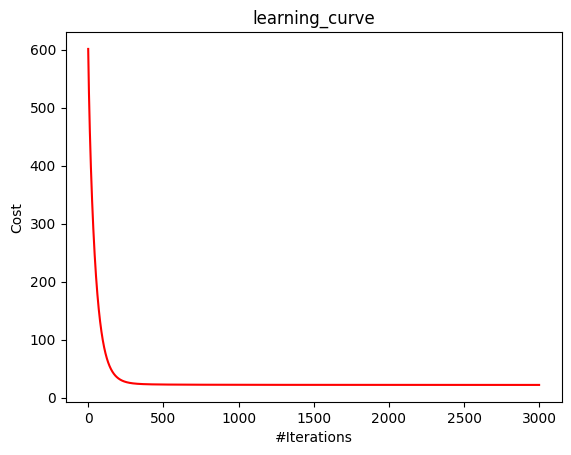

In [7]:
# Problem 3 (b) Execute this code cell, after implementing compute_cost(X, y, w)

Model_linreg, log_j_linreg = train_linreg(X_tr, y_tr, 0.005, 3000)

plt.plot(range(len(log_j_linreg)), log_j_linreg, 'r')
plt.title('learning_curve')
plt.ylabel('Cost')
plt.xlabel('#Iterations')
plt.show()

In [8]:
# Problem 3 (c) Implement the predict_linreg(X, w) below.
def predict_linreg(X, w):
    """
    predict_linreg
    Input: X - Input attributes to predict the target output
           w - Trained model weights
    Output: y_pred - predicted target values
    """
    N_tr, d_tr = X.shape
    X = np.hstack((X, np.ones((N_tr, 1))))
    
    y_pred = np.dot(X,w)
    
    # TODO: Complete this function
    
    return y_pred

4.66763967930312
5.002223099284747


(-10.0, 55.0)

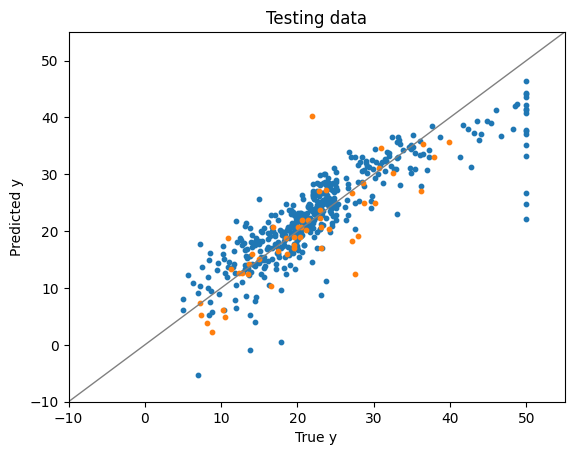

In [9]:
# Problem 3 (d)
# prediction
y_tr_pred = predict_linreg(X_tr, Model_linreg)
y_ts_pred = predict_linreg(X_ts, Model_linreg)

# print out the results
print(get_rmse(y_tr, y_tr_pred))
print(get_rmse(y_ts, y_ts_pred))

# Draw scatter plots that compare true and predicted target values
# (blue dots for y_tr; oranges dots for y_ts)
plt.scatter(y_tr,y_tr_pred, s=10)
plt.xlabel('True y')
plt.ylabel('Predicted y')
plt.title('Training data')
#plt.show()

plt.scatter(y_ts,y_ts_pred, s=10)
plt.xlabel('True y')
plt.ylabel('Predicted y')
plt.title('Testing data')
#plt.show()
 
plt.axline((-100, -100), (100, 100), c='grey', lw=1)
plt.ylim(-10, 55)
plt.xlim(-10, 55)


Initial J(w_init, D_tr) is:  601.1605263157894 

w*: 
 [ 8.21848366e+00 -2.70064795e+00 -1.52113346e+00 -4.24350636e-01
 -2.17427843e+00 -8.28643184e-01  1.13332642e+00 -5.05326849e-01
 -3.23869812e+00  6.10350456e-01 -4.26322316e-01 -2.41003851e-01
  1.80220783e+00 -3.47964065e+00  7.19130235e-02  1.34852003e-01
 -8.73585298e-01  1.13750328e+00 -5.05322771e-01 -7.97573869e-01
  1.15882805e+00 -5.05889638e-01  1.05300091e-01  3.52608349e-01
  5.79980957e-01  1.33277057e+00 -6.51394929e-02  2.65192500e-01
 -2.39437761e-01  5.64695797e-01  8.79733869e-02  5.45610448e-01
  9.39869913e-02 -1.64651094e-01  1.10650531e+00  2.28700424e-01
 -1.13295080e-01 -1.70403412e-01  2.62599384e-01 -2.39779991e-01
 -2.78694385e-01  2.75060831e-01 -2.39595994e-01 -1.21496484e-01
 -6.34748050e-01  2.82169543e-03 -2.12592232e-01  3.83518534e-02
 -1.35200766e-01 -2.99378046e-01  2.33357869e-01  7.73194671e-01
  7.97420260e-02  4.33642761e-01 -5.54108264e-01  4.88220087e-02
 -7.37916826e-02 -3.19080541e-01  3

(-10.0, 55.0)

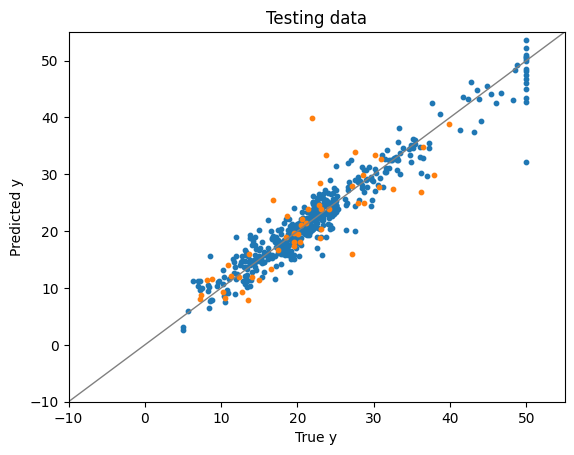

In [10]:
# Problem 3 (e)
from sklearn.preprocessing import PolynomialFeatures

# TODO: Apply the polynomial feature function
#       and create X_tr_ext from X_tr, and
#                  X_ts_ext from X_ts

degree = 2

poly = PolynomialFeatures(degree=degree)

X_tr_ext = poly.fit_transform(X_tr)
X_ts_ext = poly.transform(X_ts)


""" You do NOT need to modify the rest of the code cell """

# training
Model_linreg, log_j_linreg = train_linreg(X_tr_ext, y_tr, 0.005, 3000)

# prediction
y_tr_pred = predict_linreg(X_tr_ext, Model_linreg)
y_ts_pred = predict_linreg(X_ts_ext, Model_linreg)

print(get_rmse(y_tr, y_tr_pred))
print(get_rmse(y_ts, y_ts_pred))

# drawing a scatter plot of prediction
plt.scatter(y_tr,y_tr_pred, s=10)
plt.xlabel('True y')
plt.ylabel('Predicted y')
plt.title('Training data')

plt.scatter(y_ts,y_ts_pred, s=10)
plt.xlabel('True y')
plt.ylabel('Predicted y')
plt.title('Testing data')

plt.axline((-100, -100), (100, 100), c='grey', lw=1)
plt.ylim(-10, 55)
plt.xlim(-10, 55)

Initial J(w_init, D_tr) is:  601.1605263157894 

w*: 
 [-1.17224347  0.87668412 -0.10793768  0.71128044 -2.29857557  0.90491077
 -0.17235537 -3.95391088  2.48945876 -1.78759671 -2.15318317  0.52830263
 -3.82043973  0.07380414  0.12553033 -0.91886912  0.94415337 -0.17476393
  0.84534332  0.80563486 -0.17399194 22.55522662] 

J(w*, D_tr):  22.88813232317858


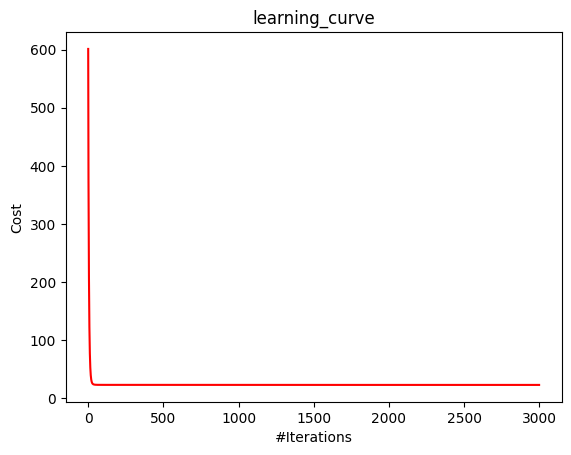

4.724709082935061
4.815956210956664


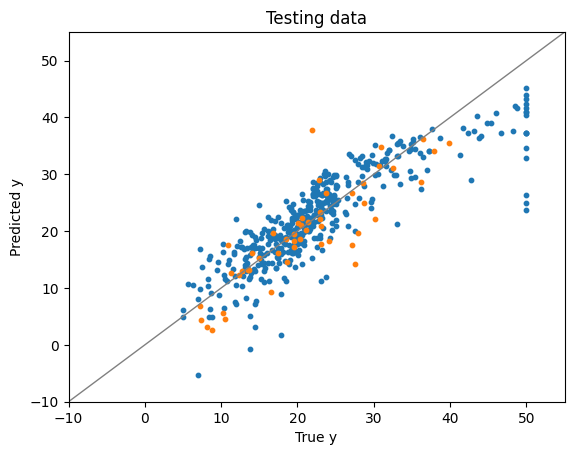

Initial J(w_init, D_tr) is:  601.1605263157894 

w*: 
 [-1.24016346 -1.04205316 -0.92736868  0.15431282 -0.78390869  0.71875459
 -0.57947643 -3.67654122  0.10189665 -0.49761526 -2.6171878  -0.79965458
 -3.39878125 -0.51498679 -0.59888769 -0.77432428  0.72061881 -0.57952697
 -0.77015274  0.71897449 -0.57948789 18.76382529] 

J(w*, D_tr):  47.76145024756259
Initial J(w_init, D_tr) is:  601.1605263157894 

w*: 
 [-1.38974781 -0.8104863  -1.2172491   0.20514466 -1.09330968  0.54272964
 -0.55737716 -5.22177614  0.79082496 -0.25185089 -3.00596493 -0.83214267
 -4.31332116 -0.36552476 -0.40483289 -1.0752449   0.54612363 -0.55740892
 -1.0614364   0.541043   -0.55737875 21.5086237 ] 

J(w*, D_tr):  34.018686516015435
Initial J(w_init, D_tr) is:  601.1605263157894 

w*: 
 [-1.48553303 -0.4227612  -1.37801879  0.2482334  -1.23395673  0.45981043
 -0.49549325 -5.9162191   1.19054418 -0.20911074 -3.05288756 -0.69491042
 -4.64146979 -0.29208619 -0.29432706 -1.20661219  0.46441685 -0.49549184
 -1.18270

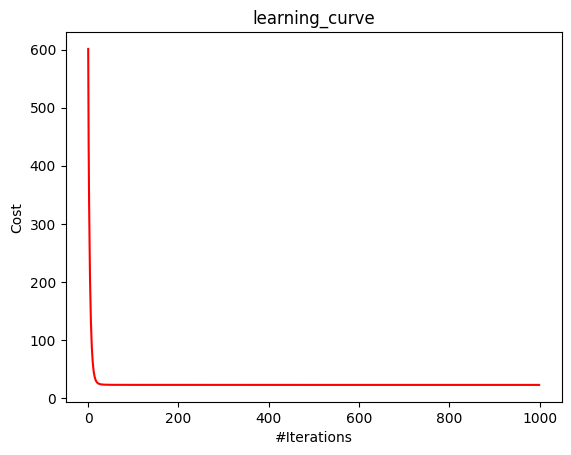

4.708741087519685
4.832266321757755


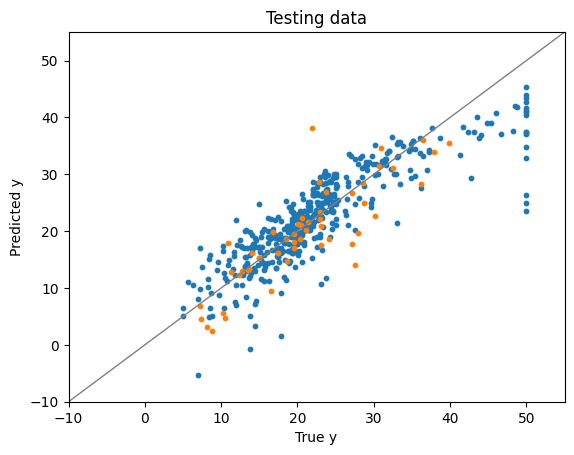

In [21]:
# Problem 3 (g, h)
def compute_cost_l2(X, y, w, l):
    """
    compute_cost_l2 L2-regularized cost function (= compute the error function J_l2(w,D))
    Input: X - Input attributes
           y - Target values
           w - model weights
    Output: cost computed given (X, y) and w (i.e., evaluation of function J())
    """
    
    # TODO: Complete this function
    N = len(y)
    y_diff = y - np.dot(X,w)
    MSE = (1 / N) * np.sum(np.square(y_diff))
    regularization_term = l * np.sum(np.square(w))
                           
    cost = MSE + regularization_term
    
    return cost


def gradient_descent_l2(X, y, w, l, alpha, n_iters, threshold=1e-07):
    """
    gradient_descent
    Input: X, y, w, alpha, n_iters
    Output: 
    """
    N = len(y)
    log_j = []
    j_last = np.Inf

    for i in range(n_iters):
        w_new = w - (-2*alpha/N * X.T @ (y - X @ w) + l*w.sum())
        
        j_new = compute_cost_l2(X, y, w, l)
        
        if j_last - j_new < threshold:
            break
            
        w = w_new
        log_j.append(j_new)
        j_last = j_new

    return w, log_j


def train_linreg_l2(X_tr, y_tr, l=1.0, alpha=0.01, n_iters=1500):
    """
    train_linreg
    Input: X_tr - Training input attributes
           y_tr - Training target values
           l - regularization parameter lambda (default: 1.0)
           alpha - learning rate alpha (default: 0.01)
           n_iters - number of iterations (default: 1500)
    Output: w_star - trained model weights
            log_j - cost history
    """
    N_tr, d_tr = X_tr.shape
    
    X_tr_b = np.hstack((X_tr, np.ones((N_tr, 1))))
    w_init = np.zeros(d_tr + 1)  # np.random.rand(d_tr + 1)
    
    initial_cost = compute_cost_l2(X_tr_b, y_tr, w_init, l)
    print("Initial J(w_init, D_tr) is: ", initial_cost, "\n")
    
    w_star, log_j = gradient_descent_l2(X_tr_b, y_tr, w_init, l, alpha, n_iters)
    
    print("w*: \n", w_star, "\n")
    print("J(w*, D_tr): ", log_j[-1])
    
    return w_star, log_j


Model_l2, log_j_l2 = train_linreg_l2(X_tr, y_tr, 0.001, 0.05, 3000)

plt.plot(range(len(log_j_l2)), log_j_l2, 'r')
plt.title('learning_curve')
plt.ylabel('Cost')
plt.xlabel('#Iterations')
plt.show()

y_tr_pred_l2 = predict_linreg(X_tr, Model_l2)
y_ts_pred_l2 = predict_linreg(X_ts, Model_l2)

print(get_rmse(y_tr, y_tr_pred_l2))
print(get_rmse(y_ts, y_ts_pred_l2))

plt.scatter(y_tr,y_tr_pred_l2, s=10)
plt.xlabel('True y')
plt.ylabel('Predicted y')
plt.title('Training data')

plt.scatter(y_ts,y_ts_pred_l2, s=10)
plt.xlabel('True y')
plt.ylabel('Predicted y')
plt.title('Testing data')

plt.axline((-100, -100), (100, 100), c='grey', lw=1)
plt.ylim(-10, 55)
plt.xlim(-10, 55)
plt.show()


## problem (h)
best_rmse = float('inf')
best_params = None

for l in np.linspace(0.001, 1.0, 50):
    for alpha in np.linspace(0.001, 1.0, 50):
        for n_iters in [1000, 2000, 3000, 4000]:
            Model_l2, log_j_l2 = train_linreg_l2(X_tr, y_tr, l, alpha, n_iters)
            y_ts_pred_l2 = predict_linreg(X_ts, Model_l2)
            rmse = get_rmse(y_ts, y_ts_pred_l2)

            if rmse < best_rmse:
                best_rmse = rmse
                best_params = {'l': l, 'alpha': alpha, 'n_iters': n_iters}
                best_l = l
                best_alpha = alpha
                best_niters = n_iters

print("best parameters:", best_params)
print("best RMSE:", best_rmse)

Model_l2, log_j_l2 = train_linreg_l2(X_tr, y_tr, best_l, best_alpha, best_niters)
plt.plot(range(len(log_j_l2)), log_j_l2, 'r')
plt.title('learning_curve')
plt.ylabel('Cost')
plt.xlabel('#Iterations')
plt.show()


y_tr_pred_l2 = predict_linreg(X_tr, Model_l2)
y_ts_pred_l2 = predict_linreg(X_ts, Model_l2)

print(get_rmse(y_tr, y_tr_pred_l2))
print(get_rmse(y_ts, y_ts_pred_l2))


plt.scatter(y_tr,y_tr_pred_l2, s=10)
plt.xlabel('True y')
plt.ylabel('Predicted y')
plt.title('Training data')

plt.scatter(y_ts,y_ts_pred_l2, s=10)
plt.xlabel('True y')
plt.ylabel('Predicted y')
plt.title('Testing data')

plt.axline((-100, -100), (100, 100), c='grey', lw=1)
plt.ylim(-10, 55)
plt.xlim(-10, 55)
plt.show()


In [54]:
# Problem 3 (i) - Perform a 5-fold crossvalidation
#                 to find the best hyperparameter combination
from sklearn.preprocessing import PolynomialFeatures

def compute_r2(y_true, y_pred):
    mean_y_true = np.mean(y_true)
    tss = np.sum((y_true - mean_y_true)**2)
    rss = np.sum((y_true - y_pred)**2)
    r2 = 1 - (rss / tss)
    return r2

def compute_rmse(y_true, y_pred):
    
    rmse = np.sqrt(np.mean((y_true - y_pred)**2))
    return rmse

def train_linreg(X_tr, y_tr, alpha=0.01, n_iters=1500):
    """
    train_linreg
    Input: X_tr - Training input attributes
           y_tr - Training target values
           alpha - learning rate alpha (default: 0.01)
           n_iters - number of iterations (default: 1500)
    Output: w_star - trained model weights
            log_j - cost history
    """
    N_tr, d_tr = X_tr.shape
    
    X_tr_b = np.hstack((X_tr, np.ones((N_tr, 1))))
    w_init = np.zeros(d_tr + 1)  # np.random.rand(d_tr + 1)
    
    initial_cost = compute_cost(X_tr_b, y_tr, w_init)
    print("Initial J(w_init, D_tr) is: ", initial_cost, "\n")
    
    w_star, log_j = gradient_descent(X_tr_b, y_tr, w_init, alpha, n_iters)
    
    print("w*: \n", w_star, "\n")
    print("J(w*, D_tr): ", log_j[-1])
    
    return w_star, log_j


Model_linreg, log_j_linreg = train_linreg(X_tr, y_tr, 0.005, 3000) # from the above executions 

# vanilla linear regression
y_pred_vanilla = predict_linreg(X_ts, Model_linreg)
r2_vanilla = compute_r2(y_ts, y_pred_vanilla)
rmse_vanilla = compute_rmse(y_ts, y_pred_vanilla)

# linear regression with polynomial features
degree = 2
poly = PolynomialFeatures(degree=degree)
X_tr_ext = poly.fit_transform(X_tr)
X_ts_ext = poly.transform(X_ts)

Model_poly, log_j_poly = train_linreg(X_tr_ext, y_tr, 0.005, 3000) # from the above executions 
y_pred_poly = predict_linreg(X_ts_ext, Model_poly)
r2_poly = compute_r2(y_ts, y_pred_poly)
rmse_poly = compute_rmse(y_ts, y_pred_poly)

# L2 regularized linear regression
Model_l2, log_j_l2 = train_linreg_l2(X_tr, y_tr, 0.001, 0.05, 3000) # from the above executions 
y_pred_l2 = predict_linreg(X_ts, Model_l2)
r2_l2 = compute_r2(y_ts, y_pred_l2)
rmse_l2 = compute_rmse(y_ts, y_pred_l2)

print("Vanilla Linear Regression / R2:", r2_vanilla, "RMSE:", rmse_vanilla)
print("Linear Regression with Polynomial Features / R2:", r2_poly, "RMSE:", rmse_poly)
print("L2 Regularized Linear Regression / R2:", r2_l2, "RMSE:", rmse_l2)

Initial J(w_init, D_tr) is:  601.1605263157894 

w*: 
 [-0.98423976  0.9789124   0.19501163  0.87777439 -0.78209369  1.05873945
 -0.09628398 -3.04293934  2.14854721 -1.55106407 -1.89858986  0.85519071
 -3.47077153  0.17586123  0.24059276 -0.64204962  1.05874273 -0.09680907
 -0.47352301  1.06483885 -0.09673251 22.69649123] 

J(w*, D_tr):  21.786880042225047
Initial J(w_init, D_tr) is:  601.1605263157894 

w*: 
 [ 8.21848366e+00 -2.70064795e+00 -1.52113346e+00 -4.24350636e-01
 -2.17427843e+00 -8.28643184e-01  1.13332642e+00 -5.05326849e-01
 -3.23869812e+00  6.10350456e-01 -4.26322316e-01 -2.41003851e-01
  1.80220783e+00 -3.47964065e+00  7.19130235e-02  1.34852003e-01
 -8.73585298e-01  1.13750328e+00 -5.05322771e-01 -7.97573869e-01
  1.15882805e+00 -5.05889638e-01  1.05300091e-01  3.52608349e-01
  5.79980957e-01  1.33277057e+00 -6.51394929e-02  2.65192500e-01
 -2.39437761e-01  5.64695797e-01  8.79733869e-02  5.45610448e-01
  9.39869913e-02 -1.64651094e-01  1.10650531e+00  2.28700424e-01
 

In [15]:
#probelem (j)
best_rmse = float('inf')
best_params = None

l_values = np.linspace(0.0001, 1.0, 50)
alpha_values = np.linspace(0.001, 1.0, 50)

for l in l_values:
    for alpha in alpha_values:
        cross_rmse = []
        folds = np.array_split(np.arange(len(X_tr)), 5)

        for i in range(5):
            val_data = folds[i]
            
            train_data_all = []
            for j, f in enumerate(folds):
                if j != i:
                    train_data_all.append(f)

            train_data = np.concatenate(train_data_all)
                
            X_cross_train, y_cross_train = X_tr[train_data], y_tr[train_data]
            X_cross_val, y_cross_val = X_tr[val_data], y_tr[val_data]

            Model_l2_cross, log_j_l2_cross = train_linreg_l2(X_cross_train, y_cross_train, l, alpha, n_iters=3000)
            y_cross_pred = predict_linreg(X_cross_val, Model_l2_cross)
            cross_rmse.append(get_rmse(y_cross_val, y_cross_pred))
            
        avg_rmse = np.mean(cross_rmse)
        
        if avg_rmse < best_rmse:
            best_rmse = avg_rmse
            best_params = {'l': l, 'alpha': alpha}
            best_l = l
            best_alpha = alpha

Model_l2_final, log_j_l2_final = train_linreg_l2(X_tr, y_tr, best_l, best_alpha, n_iters=3000)
y_ts_pred_l2_final = predict_linreg(X_ts, Model_l2_final)
testing_rmse = get_rmse(y_ts, y_ts_pred_l2_final)

print("Best Hyperparameters:", best_params)
print("training RMSE : ", best_rmse)
print("testing RMSE :", testing_rmse)


Initial J(w_init, D_tr) is:  623.8912362637363 

w*: 
 [-1.17623664e+00  7.68409281e-02 -3.07087424e-01  5.79203627e-01
 -1.11400470e+00  7.09317550e-01 -5.74635479e-01 -5.35964026e+00
  1.18147235e+00 -6.88936063e-02 -2.82954448e+00  2.00484199e-01
 -4.28121039e+00 -3.40394305e-02 -8.44377320e-03 -1.08051044e+00
  7.14065878e-01 -5.74724422e-01 -1.07475428e+00  7.12527260e-01
 -5.74608420e-01  2.23505673e+01] 

J(w*, D_tr):  28.186001629929557
Initial J(w_init, D_tr) is:  586.219506849315 

w*: 
 [-1.2125621  -0.24725826 -3.4586569   0.94647593 -1.3167781   0.60235214
 -0.23413689 -4.45439233  3.07779627  0.34764159 -2.05112921  0.05054159
 -4.21082057 -0.16505436 -0.40886132 -1.29061002  0.60628772 -0.23403267
 -1.26694869  0.61132451 -0.23432883 21.42569295] 

J(w*, D_tr):  24.88374595478088
Initial J(w_init, D_tr) is:  498.39243835616435 

w*: 
 [-1.10314212e+00 -3.52845415e-01 -4.42814244e-01  6.21931886e-01
 -9.01512521e-01  2.78598986e-01 -1.54595323e-01 -3.76130086e+00
  6.4181